# Data visualization

Used log1p counts

SUbset: pretty neuron fraction

In [1]:
from datetime import datetime

print(f"Timestamp: {datetime.now()}")

Timestamp: 2025-12-23 10:10:35.415902


In [2]:
from pathlib import Path
import sys
import os
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.patches as mpatches
import matplotlib.colors as clr
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
import math
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import seaborn as sns

In [3]:
plt.rcParams['figure.figsize'] = (3,3)
plt.rcParams["figure.dpi"] = 150

In [4]:
sys.path.append(str(Path.cwd().resolve().parents[1]))

from config.paths import BASE_DIR

input_dir = BASE_DIR / "data/h5ad/export_04/04b_reclustered"
output_dir = BASE_DIR / "2025-12-22"

output_dir.mkdir(parents=True, exist_ok=True)

input_file = input_dir / "neurons-seurat.h5ad"

In [5]:
sc.settings.figdir = output_dir

# Functions

### DE Comparison

In [6]:
def de_comparison(adata, groupby, save_path, group_name, reference, n_genes=10):
    """
    Runs rank_genes_groups for a specific pair of groups, saves results, 
    and returns top N markers.
    """
    # 1. Run differential expression against a specific reference group
    sc.tl.rank_genes_groups(
        adata, 
        groupby=groupby, 
        groups=[group_name], 
        reference=reference, 
        method="wilcoxon"
    )
    
    # 2. Extract full dataframe and save
    markers_df = sc.get.rank_genes_groups_df(adata, group=group_name)
    markers_df.to_csv(save_path, index=False)
    
    # 3. Extract top N gene list
    top_genes = (
        markers_df.sort_values("scores", ascending=False)
        .head(n_genes)["names"]
        .tolist()
    )
    
    return top_genes

### KDE Plots

In [7]:
def kde_grid_plot(
    adata, genes, palette, alpha, linewidth,
    group_col="reporter_status", ncols=5, subplot_size=(2.5, 2.5), gene_fontsize=14
):
    sns.set_theme(style="ticks")
    df = adata.to_df()[genes]
    nrows = math.ceil(len(genes) / ncols)

    fig, axes = plt.subplots(
        nrows, ncols, 
        figsize=(ncols * subplot_size[0], nrows * subplot_size[1])
    )
    axes = np.atleast_1d(axes).flatten()

    for i, gene in enumerate(genes):
        ax = axes[i]
        for cat, color in palette.items():
            mask = adata.obs[group_col] == cat
            if mask.any():
                sns.kdeplot(
                    df.loc[mask, gene], ax=ax, fill=True, color=color,
                    alpha=alpha.get(cat, 0.4) if isinstance(alpha, dict) else alpha,
                    linewidth=linewidth.get(cat, 2) if isinstance(linewidth, dict) else linewidth,
                    label=str(cat)
                )

        ax.set_title(f"$\\it{{{gene}}}$", fontsize=gene_fontsize)
        ax.set_yticks([])
        ax.set_ylabel("Density" if i % ncols == 0 else "", fontsize=10)
        ax.set_xlabel("")
        ax.tick_params(axis="x", labelsize=8)

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    sns.despine()
    plt.tight_layout()
    return fig

### Matrixplot 

In [8]:
def custom_matrixplot(adata, genes, group_col, label_map=None, palette=None, figsize=(12, 3), **kwargs):
    # 1. Identify which categories to plot
    valid_cats = [cat for cat in (label_map.keys() if label_map else adata.obs[group_col].cat.categories) 
                  if cat in adata.obs[group_col].cat.categories]
    subset = adata[adata.obs[group_col].isin(valid_cats)].copy()
    
    # 2. Map to desirable plot labels (or fallback to original)
    plot_col = f"{group_col}_plot" if label_map else group_col
    if label_map:
        subset.obs[plot_col] = subset.obs[group_col].map(label_map).astype('category')
        subset.obs[plot_col] = subset.obs[plot_col].cat.reorder_categories([label_map[cat] for cat in valid_cats])
    
    # 3. Set colors for the new plot labels
    if palette:
        subset.uns[f"{plot_col}_colors"] = [palette[cat] for cat in valid_cats]

    # 4. Generate matrixplot
    return sc.pl.matrixplot(subset, var_names=genes, groupby=plot_col, figsize=figsize, **kwargs)

In [9]:
# Labels for matrixplot
labels = {
    "EGFP_Seq1_hi": "EGFP+", 
    "dTomato_Seq2_hi": "dTomato+", 
    "EGFP_dTomato_dual_hi": "Double-positive",
    "Negative": "Negative"
}

## Prepare data

In [10]:
adata = sc.read_h5ad(input_file)
adata.obs.EGFP_dTomato_dual_hi.value_counts()

EGFP_dTomato_dual_hi
False    22392
True        19
Name: count, dtype: int64

In [11]:
adata.X = adata.layers['log1p'].copy()

In [12]:
# subset to CGRP-Gamma
#adata = adata[adata.obs['seurat_labels'] == 'CGRP-Gamma'].copy()

### Create `reporter_status` column

In [13]:
# Define conditions with explicit exclusion to ensure dual-positives are prioritized
conditions = [
    adata.obs['EGFP_dTomato_dual_hi'] == True,
    (adata.obs['EGFP_Seq1_hi'] == True) & (adata.obs['EGFP_dTomato_dual_hi'] == False),
    (adata.obs['dTomato_Seq2_hi'] == True) & (adata.obs['EGFP_dTomato_dual_hi'] == False)
]

# Choices remain the same
choices = [
    'EGFP_dTomato_dual_hi', 
    'EGFP_Seq1_hi', 
    'dTomato_Seq2_hi'
]

adata.obs['reporter_status'] = np.select(conditions, choices, default='Negative')

# Convert to categorical for better plotting performance
adata.obs['reporter_status'] = adata.obs['reporter_status'].astype('category')

adata.obs.reporter_status.value_counts()

reporter_status
Negative                22264
dTomato_Seq2_hi            89
EGFP_Seq1_hi               39
EGFP_dTomato_dual_hi       19
Name: count, dtype: int64

### Create `innervation_pattern` column

In [14]:
# Define mapping for broader categories
innervation_map = {
    'EGFP_dTomato_dual_hi': 'Double-positive',
    'EGFP_Seq1_hi': 'Single-positive',
    'dTomato_Seq2_hi': 'Single-positive',
    'Negative': 'Negative'
}

# Apply the map to the existing reporter_status column
adata.obs['innervation_pattern'] = adata.obs['reporter_status'].map(innervation_map)

# Convert to categorical and set a logical order for plotting
adata.obs['innervation_pattern'] = adata.obs['innervation_pattern'].astype('category')
pattern_order = ['Double-positive', 'Single-positive', 'Negative']
adata.obs['innervation_pattern'] = adata.obs['innervation_pattern'].cat.reorder_categories(pattern_order)

print(adata.obs.innervation_pattern.value_counts())

innervation_pattern
Negative           22264
Single-positive      128
Double-positive       19
Name: count, dtype: int64


# DE Testing
## Double-positive vs. single-positive

In [15]:
# Define your desired contrast
test_group = 'Double-positive'
reference_group = 'Single-positive'

# Run the fixed function
top10_genes = de_comparison(
    adata=adata, 
    groupby="innervation_pattern", 
    group_name=test_group, 
    reference=reference_group,
    save_path=output_dir / "dual_vs_single_markers.csv",
    n_genes=10
)

top10_genes

['Chrna3',
 'Htr3a',
 'Cartpt',
 'Jak1',
 'Nefm',
 'Pou4f2',
 'Nrsn1',
 'Mgat5b',
 'Htr3b',
 'Ngfr']

In [16]:
palette = {
    "Single-positive": "orange", 
    "Double-positive": "blue",
    "Negative": "black"
}

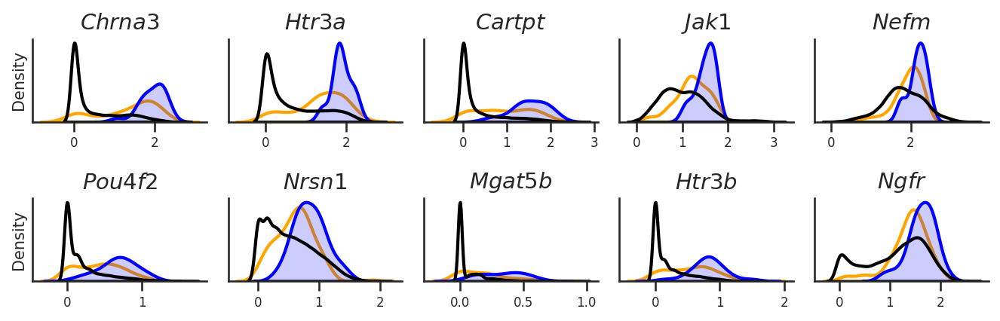

In [17]:
fig = kde_grid_plot(
    adata=adata,
    genes=top10_genes,
    group_col="innervation_pattern",
    ncols=5,
    subplot_size=(1.8, 1.5),
    palette= palette,
    alpha={
        "Double-positive": 0.2, 
        "Single-positive": 0, 
        "Negative": 0
    },
    # Set custom line thickness: dual-positive is bold (3.5), others are thinner (2)
    linewidth={
        "Double-positive": 2,  
        "Single-positive": 2, 
        "Negative": 2
    }
)

plt.show()

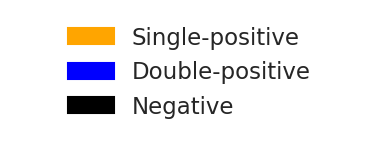

In [18]:
fig_leg, ax_leg = plt.subplots(figsize=(3, 1))

# Create dummy patches using the clean labels dictionary
patches = [
    mpatches.Patch(color=color, label=labels.get(raw_label, raw_label)) 
    for raw_label, color in palette.items()
]

# Add the legend to the center of the blank plot
ax_leg.legend(handles=patches, loc='center', frameon=False, ncol=1)

# Hide the axis completely
ax_leg.axis('off')

plt.show()

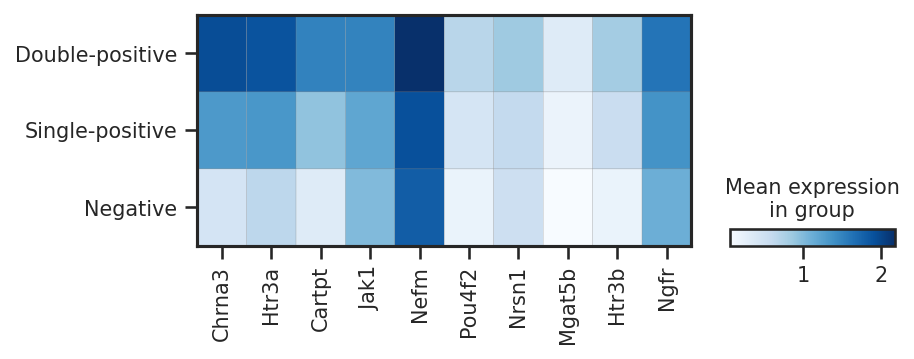

In [19]:
matrix_fig = custom_matrixplot(
    adata=adata,
    genes=top10_genes,
    group_col="innervation_pattern",
    #label_map=labels,  # Passing your new 'labels' dict
    palette=palette,   # Uses the palette: limegreen, magenta, blue, black
    #standard_scale='var',
    cmap='Blues',
    figsize = (6,2)
)

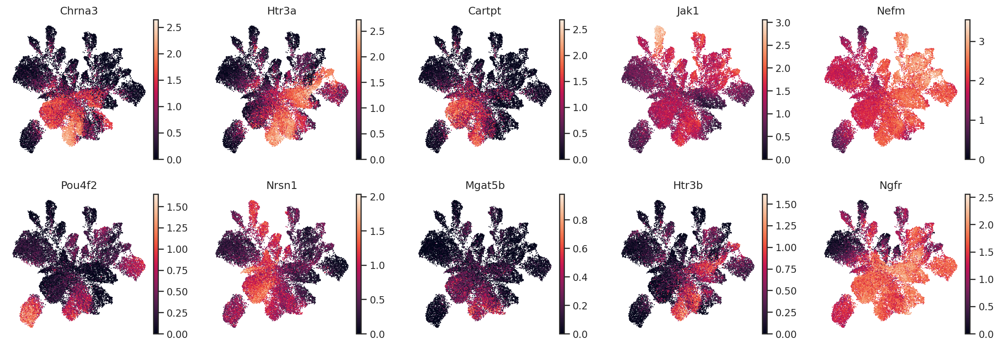

In [20]:
sc.pl.umap(adata, color = top10_genes, frameon = False, ncols = 5)

# DE - double positive vs. dTomato +

In [21]:
# Define your desired contrast
test_group = 'EGFP_dTomato_dual_hi'
reference_group = 'dTomato_Seq2_hi'

# Run the fixed function
top10_genes = de_comparison(
    adata=adata, 
    groupby="reporter_status", 
    group_name=test_group, 
    reference=reference_group,
    save_path=output_dir / "dual_vs_dtomato_markers.csv",
    n_genes=10
)

top10_genes

['Jak1',
 'Chrna3',
 'Htr3a',
 'Adcyap1',
 'Ngfr',
 'Cartpt',
 'Nefm',
 'Kcnq3',
 'Pou4f2',
 'Nrsn1']

In [22]:
palette = {
    "EGFP_Seq1_hi": "limegreen", 
    "dTomato_Seq2_hi": "magenta", 
    "EGFP_dTomato_dual_hi": "blue",
    "Negative": "black"
}

In [23]:
adata.obs.columns

Index(['cell_id', 'x_centroid', 'y_centroid', 'transcript_counts',
       'control_probe_counts', 'genomic_control_counts',
       'control_codeword_counts', 'unassigned_codeword_counts',
       'deprecated_codeword_counts', 'total_counts', 'cell_area',
       'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id',
       'output_id', 'region_id', 'slide_id', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'log1p_total_counts',
       'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'batch',
       '_scvi_batch', '_scvi_labels', 'leiden_scVI_1', 'scanvi_labels',
       'seurat_labels', 'prediction.score.CGRP.Theta',
       'prediction.score.CGRP.Gamma', 'prediction.score.CGRP.Alpha',
       'prediction.score.Nonpeptidergic.nociceptors',
       'prediction.score.C.LTMR', 'prediction.score.Sst',
       'prediction.score.CGRP.Zeta', 'prediction.score.CGRP.Epsilion',
       'prediction.score.

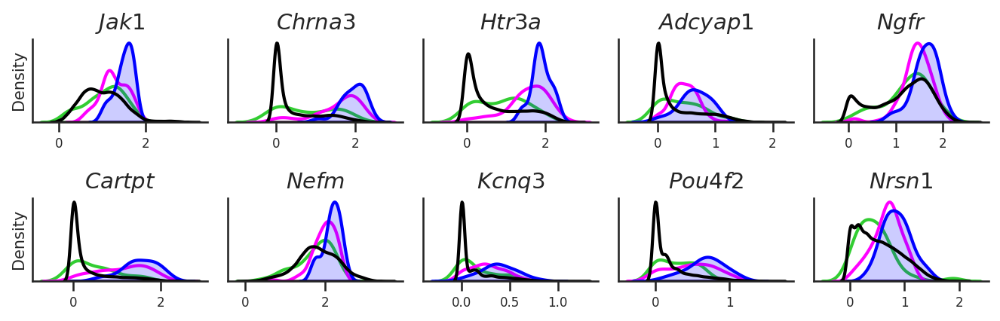

In [24]:
fig = kde_grid_plot(
    adata=adata,
    genes=top10_genes,
    group_col="reporter_status",
    ncols=5,
    subplot_size=(1.8, 1.5),
    palette= palette,
    alpha={
        "EGFP_Seq1_hi": 0, 
        "dTomato_Seq2_hi": 0, 
        "EGFP_dTomato_dual_hi": 0.2,
        "Negative": 0
    },
    # Set custom line thickness: dual-positive is bold (3.5), others are thinner (2)
    linewidth={
        "EGFP_Seq1_hi": 2,  
        "dTomato_Seq2_hi": 2, 
        "EGFP_dTomato_dual_hi": 2
    }
)

plt.show()

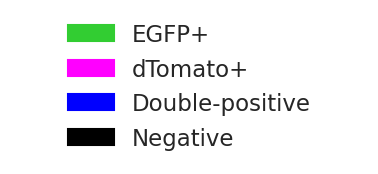

In [25]:
fig_leg, ax_leg = plt.subplots(figsize=(3, 1))

# Create dummy patches using the clean labels dictionary
patches = [
    mpatches.Patch(color=color, label=labels.get(raw_label, raw_label)) 
    for raw_label, color in palette.items()
]

# Add the legend to the center of the blank plot
ax_leg.legend(handles=patches, loc='center', frameon=False, ncol=1)

# Hide the axis completely
ax_leg.axis('off')

plt.show()

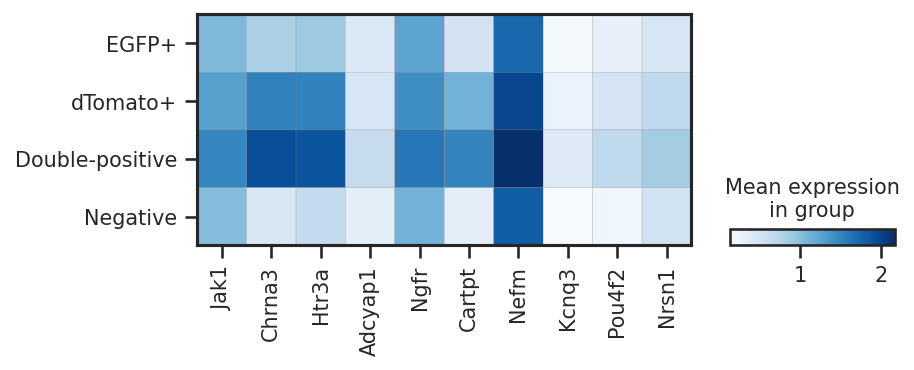

In [26]:
matrix_fig = custom_matrixplot(
    adata=adata,
    genes=top10_genes,
    group_col="reporter_status",
    label_map=labels,  # Passing your new 'labels' dict
    palette=palette,   # Uses the palette: limegreen, magenta, blue, black
    #standard_scale='var',
    cmap='Blues',
    figsize = (6,2)
)

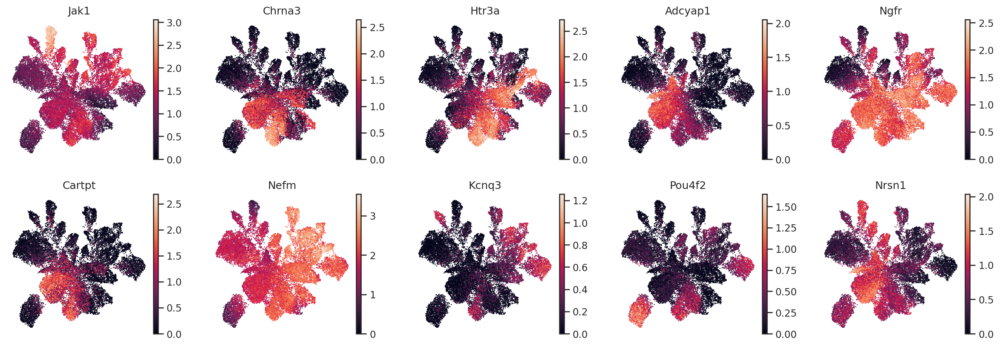

In [27]:
sc.pl.umap(adata, color = top10_genes, frameon = False, ncols = 5, cmap = 'rocket')

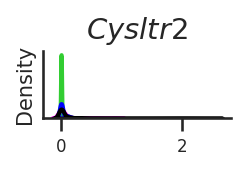

In [36]:
genes = ['Cysltr2']

fig = kde_grid_plot(
    adata=adata,
    genes=genes,
    group_col="reporter_status",
    ncols=1,
    subplot_size=(1.8, 1.3),
    palette= palette,
    alpha={
        "EGFP_Seq1_hi": 0, 
        "dTomato_Seq2_hi": 0, 
        "EGFP_dTomato_dual_hi": 0.2,
        "Negative": 0
    },
    # Set custom line thickness: dual-positive is bold (3.5), others are thinner (2)
    linewidth={
        "EGFP_Seq1_hi": 2,  
        "dTomato_Seq2_hi": 2, 
        "EGFP_dTomato_dual_hi": 2
    }
)

plt.show()

/tmp/ipykernel_1426/2264963461.py:20: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/tmp/ipykernel_1426/2264963461.py:20: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/tmp/ipykernel_1426/2264963461.py:20: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/tmp/ipykernel_1426/2264963461.py:20: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
/tmp/ipykernel_1426/2264963461.py:20: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(


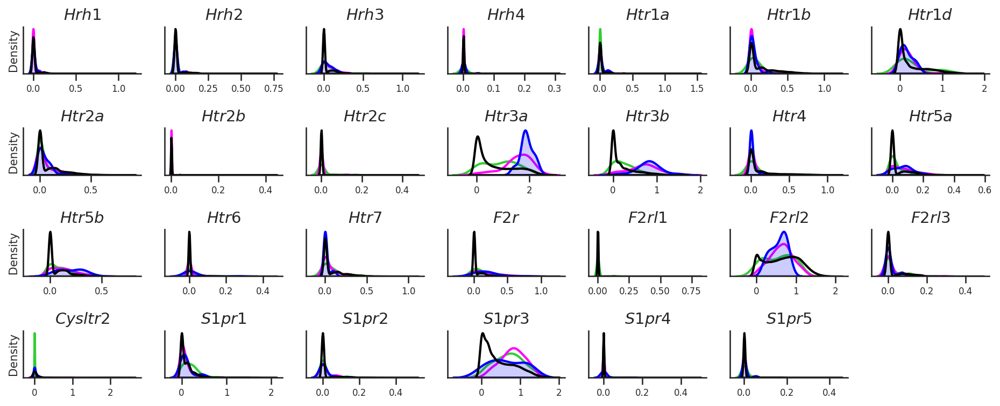

In [28]:
genes = [
    'Hrh1', 'Hrh2', 'Hrh3', 'Hrh4', 'Htr1a', 'Htr1b', 'Htr1d', 'Htr2a', 'Htr2b', 
    'Htr2c', 'Htr3a', 'Htr3b', 'Htr4', 'Htr5a', 'Htr5b', 'Htr6', 'Htr7', 'F2r', 
    'F2rl1', 'F2rl2', 'F2rl3', 'Cysltr2', 'S1pr1', 'S1pr2', 'S1pr3', 'S1pr4', 'S1pr5'
]

fig = kde_grid_plot(
    adata=adata,
    genes=genes,
    group_col="reporter_status",
    ncols=7,
    subplot_size=(1.8, 1.3),
    palette= palette,
    alpha={
        "EGFP_Seq1_hi": 0, 
        "dTomato_Seq2_hi": 0, 
        "EGFP_dTomato_dual_hi": 0.2,
        "Negative": 0
    },
    # Set custom line thickness: dual-positive is bold (3.5), others are thinner (2)
    linewidth={
        "EGFP_Seq1_hi": 2,  
        "dTomato_Seq2_hi": 2, 
        "EGFP_dTomato_dual_hi": 2
    }
)

plt.show()

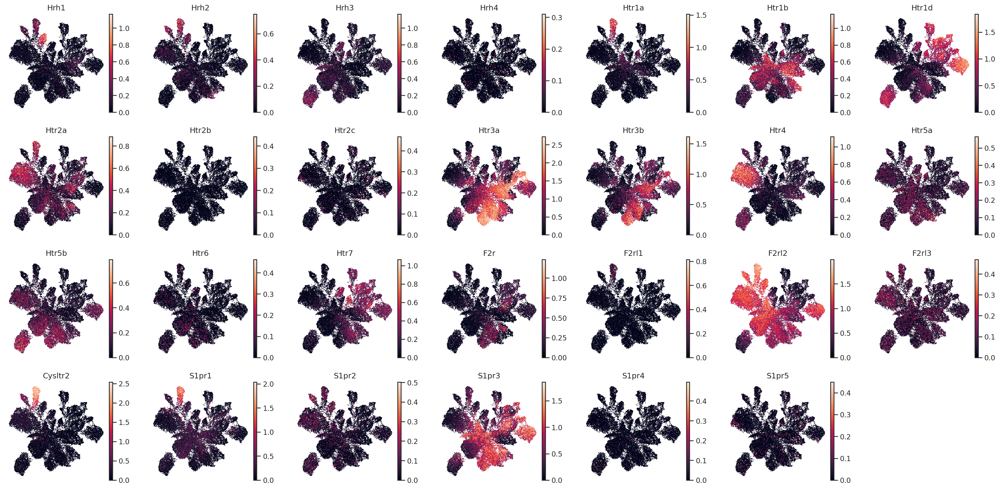

In [29]:
sc.pl.umap(adata, color = genes, frameon = False, ncols = 7)

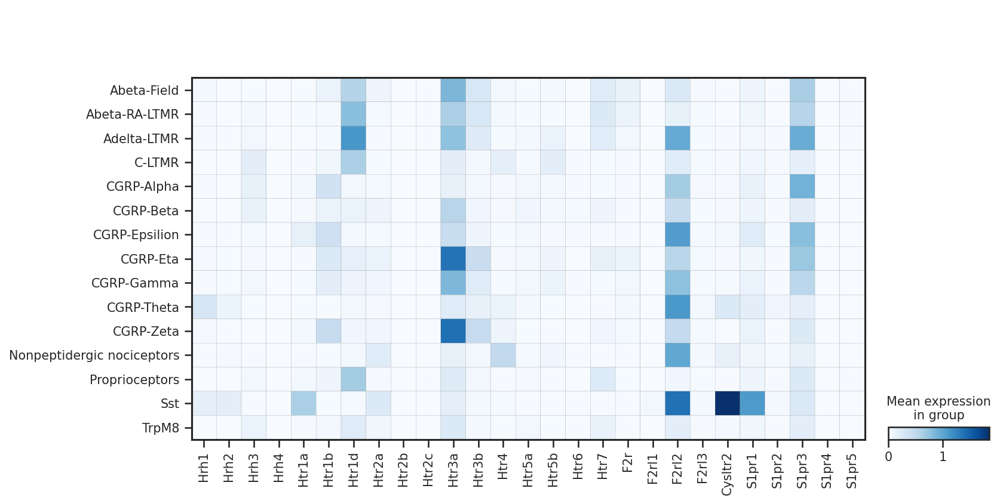

In [30]:
sc.pl.matrixplot(adata, var_names = genes, groupby = 'seurat_labels', cmap = 'Blues')

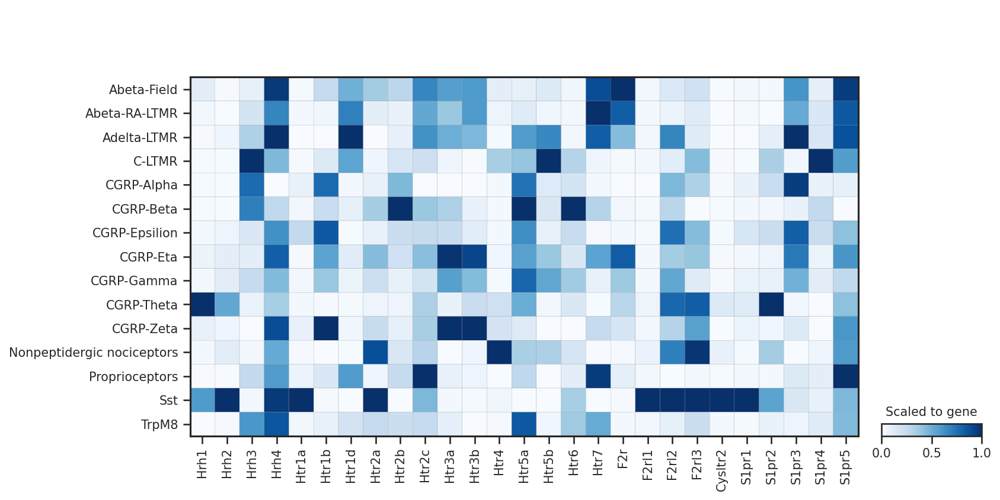

In [31]:
sc.pl.matrixplot(adata, var_names = genes, groupby = 'seurat_labels', cmap = 'Blues', standard_scale = 'var', colorbar_title = 'Scaled to gene')

In [32]:
adata.obs.columns

Index(['cell_id', 'x_centroid', 'y_centroid', 'transcript_counts',
       'control_probe_counts', 'genomic_control_counts',
       'control_codeword_counts', 'unassigned_codeword_counts',
       'deprecated_codeword_counts', 'total_counts', 'cell_area',
       'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id',
       'output_id', 'region_id', 'slide_id', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'log1p_total_counts',
       'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'batch',
       '_scvi_batch', '_scvi_labels', 'leiden_scVI_1', 'scanvi_labels',
       'seurat_labels', 'prediction.score.CGRP.Theta',
       'prediction.score.CGRP.Gamma', 'prediction.score.CGRP.Alpha',
       'prediction.score.Nonpeptidergic.nociceptors',
       'prediction.score.C.LTMR', 'prediction.score.Sst',
       'prediction.score.CGRP.Zeta', 'prediction.score.CGRP.Epsilion',
       'prediction.score.

In [33]:
# Create a cross-tabulation to see the overlap between Seurat labels and Leiden clusters
cluster_map = pd.crosstab(adata.obs['seurat_labels'], adata.obs['neuron_recluster_seurat'])

# Print the full table
print(cluster_map)

# To specifically look at the CGRP-Gamma breakdown:
print("\nCGRP-Gamma Breakdown:")
print(cluster_map.loc[['CGRP-Gamma']])

neuron_recluster_seurat        0     1     2     3     4     5    6    7    8  \
seurat_labels                                                                   
Abeta-Field                   10    57   144   512   616    12   50    0    1   
Abeta-RA-LTMR                  6     0     6    25  1014     7   88    0    2   
Adelta-LTMR                    1     4     5     0     5    10  991    0    0   
C-LTMR                        13    26     3     1     0  1347    2    0   10   
CGRP-Alpha                   242     0     0     2     0     0    0    0    1   
CGRP-Beta                     71     0     1     0     0     1    0    0   56   
CGRP-Epsilion                539    15     2    43     0     0    4    1    0   
CGRP-Eta                      44    40  1489   324     3    32    4    0   14   
CGRP-Gamma                  3811   152  2087    40     1    32   21    4   21   
CGRP-Theta                    55    44     2     9     3     7    0  740    5   
CGRP-Zeta                   

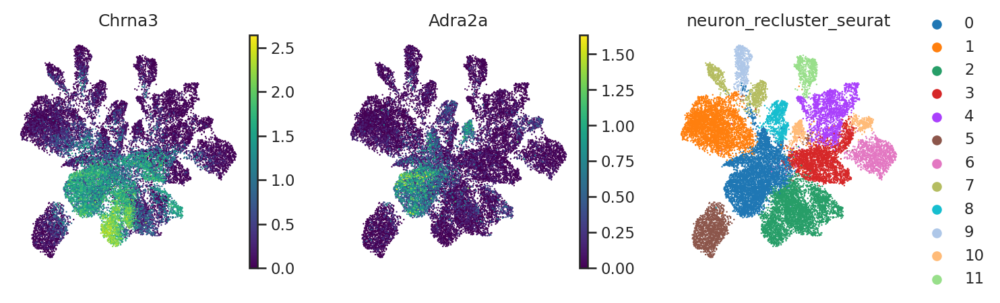

In [34]:
sc.pl.umap(adata, color = ['Chrna3', 'Adra2a', 'neuron_recluster_seurat'], cmap = 'viridis', frameon = False)